# Setup & installs

In [2]:
# Colab cell 1 — install required libraries
!pip install -q --upgrade pip
# core libs
!pip install -q transformers diffusers accelerate safetensors ftfy==6.1.1
!pip install -q sentence-transformers faiss-cpu pillow tqdm
# optional GPU-accelerated faiss on Colab (if GPU available) - uncomment if you want GPU FAISS
# !pip install -q faiss-gpu

# If using BLIP via HuggingFace transformers
!pip install -q torch torchvision --upgrade


# Download COCO dataset

In [4]:
import os

# Only necessary once. Downloads ~1.9GB images + annotations ~200MB.
!mkdir -p data/coco
if not os.path.exists('data/coco/val2017'):
    !wget -q http://images.cocodataset.org/zips/val2017.zip -O /tmp/val2017.zip
    !unzip -q /tmp/val2017.zip -d data/coco
if not os.path.exists('data/coco/captions_val2017.json'):
    !wget -q http://images.cocodataset.org/annotations/annotations_trainval2017.zip -O /tmp/ann.zip
    !unzip -q /tmp/ann.zip -d /tmp/ann
    !mv /tmp/ann/annotations/captions_val2017.json data/coco/
print("Images:", len(os.listdir('data/coco/val2017')))
print("Captions:", os.path.exists('data/coco/captions_val2017.json'))

Images: 5000
Captions: True


In [ ]:
# Paste your HF token here (or set as environment variable). Get it from https://huggingface.co/settings/tokens
HF_TOKEN = "your_huggingface_token_here"
import os
os.environ['HF_TOKEN'] = HF_TOKEN


In [6]:
from google.colab import drive
drive.mount('/content/drive')

!mkdir -p '/content/drive/MyDrive/COCO'
!wget http://images.cocodataset.org/zips/val2017.zip -O '/content/drive/MyDrive/COCO/val2017.zip'
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip -O '/content/drive/MyDrive/COCO/annotations.zip'


Mounted at /content/drive
--2025-12-05 19:10:57--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 16.182.34.153, 16.15.179.34, 3.5.16.59, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|16.182.34.153|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘/content/drive/MyDrive/COCO/val2017.zip’

/content/drive/MyDr 100%[===================>] 777.80M  14.6MB/s    in 57s     

2025-12-05 19:11:54 (13.7 MB/s) - ‘/content/drive/MyDrive/COCO/val2017.zip’ saved [815585330/815585330]

--2025-12-05 19:11:55--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.6.216, 52.216.184.147, 16.15.189.223, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.6.216|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [applica

In [7]:
!unzip '/content/drive/MyDrive/COCO/val2017.zip' -d '/content/drive/MyDrive/COCO/'
!unzip '/content/drive/MyDrive/COCO/annotations.zip' -d '/content/drive/MyDrive/COCO/'


Streaming output truncated to the last 5000 lines.
 extracting: /content/drive/MyDrive/COCO/val2017/000000365745.jpg  
 extracting: /content/drive/MyDrive/COCO/val2017/000000320425.jpg  
 extracting: /content/drive/MyDrive/COCO/val2017/000000481404.jpg  
 extracting: /content/drive/MyDrive/COCO/val2017/000000314294.jpg  
 extracting: /content/drive/MyDrive/COCO/val2017/000000335328.jpg  
 extracting: /content/drive/MyDrive/COCO/val2017/000000513688.jpg  
 extracting: /content/drive/MyDrive/COCO/val2017/000000158548.jpg  
 extracting: /content/drive/MyDrive/COCO/val2017/000000132116.jpg  
 extracting: /content/drive/MyDrive/COCO/val2017/000000415238.jpg  
 extracting: /content/drive/MyDrive/COCO/val2017/000000321333.jpg  
 extracting: /content/drive/MyDrive/COCO/val2017/000000081738.jpg  
 extracting: /content/drive/MyDrive/COCO/val2017/000000577584.jpg  
 extracting: /content/drive/MyDrive/COCO/val2017/000000346905.jpg  
 extracting: /content/drive/MyDrive/COCO/val2017/000000433980.jpg

# Mount Drive & imports

In [8]:
# Colab cell 2 — mount drive and imports
from google.colab import drive
drive.mount('/content/drive')

import os, json, math, time, random
from pathlib import Path
from PIL import Image
from tqdm import tqdm
import numpy as np

# ML libs
import torch
from transformers import CLIPProcessor, CLIPModel, pipeline
from sentence_transformers import SentenceTransformer
import faiss
from diffusers import StableDiffusionPipeline, LMSDiscreteScheduler
import gradio as gr


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Model

In [9]:
# Colab cell 3 — device and lightweight model names (change if needed)
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# Lightweight text embedding model for retrieval
TEXT_EMBED_MODEL = "sentence-transformers/all-MiniLM-L6-v2"  # small, fast

# CLIP for image embeddings
CLIP_MODEL = "openai/clip-vit-base-patch32"

# BLIP captioning model (Hugging Face)
BLIP_MODEL = "Salesforce/blip-image-captioning-base"

# Stable Diffusion model (may require Hugging Face token for some checkpoints)
SD_MODEL = "runwayml/stable-diffusion-v1-5"  # common choice; change if you have a preferred checkpoint

# Default image dims (will use these when user doesn't provide)
DEFAULT_WIDTH = 512
DEFAULT_HEIGHT = 512


Device: cuda


# Build / load embeddings (index COCO)

In [10]:
# ----------------------------
# Colab cell — robust COCO indexing (replacement)
# ----------------------------
import os, json, random, math
from pathlib import Path
from PIL import Image
import numpy as np
from tqdm import tqdm
import torch

# Models you already set earlier (reuse if present)
try:
    clip_processor
    clip_model
    text_embedder
    CLIP_MODEL
except NameError:
    from transformers import CLIPProcessor, CLIPModel
    from sentence_transformers import SentenceTransformer
    CLIP_MODEL = "openai/clip-vit-base-patch32"
    TEXT_EMBED_MODEL = "sentence-transformers/all-MiniLM-L6-v2"
    clip_processor = CLIPProcessor.from_pretrained(CLIP_MODEL)
    clip_model = CLIPModel.from_pretrained(CLIP_MODEL).to("cuda" if torch.cuda.is_available() else "cpu")
    text_embedder = SentenceTransformer(TEXT_EMBED_MODEL, device="cuda" if torch.cuda.is_available() else "cpu")

COCO_ROOT = "/content/drive/MyDrive/COCO"   # your path
candidates = [
    (os.path.join(COCO_ROOT, "annotations", "captions_train2017.json"), os.path.join(COCO_ROOT, "train2017")),
    (os.path.join(COCO_ROOT, "annotations", "captions_val2017.json"), os.path.join(COCO_ROOT, "val2017")),
    (os.path.join(COCO_ROOT, "annotations", "captions_val2017.json"), os.path.join(COCO_ROOT, "train2017")),
]

# pick first annotation file that exists
ANNOTATIONS_FILE = None
IMAGES_DIR = None
for ann_path, img_dir in candidates:
    if os.path.exists(ann_path) and os.path.isdir(img_dir):
        ANNOTATIONS_FILE = ann_path
        IMAGES_DIR = img_dir
        break

# If not auto-detected, give explicit diagnostics and try to continue with user-specified names
if ANNOTATIONS_FILE is None:
    print("Couldn't auto-detect COCO annotations+image dir under", COCO_ROOT)
    print("Please verify the folder structure under /content/drive/MyDrive/COCO — expected e.g.:")
    print(" - annotations/captions_train2017.json")
    print(" - train2017/  (images)")
    # list top-level entries to help debug
    print("\nTop-level entries in COCO_ROOT:")
    for p in sorted(os.listdir(COCO_ROOT))[:50]:
        print(" ", p)
    raise SystemExit("Fix dataset layout or set COCO_ROOT correctly and re-run this cell.")

print("Using annotations:", ANNOTATIONS_FILE)
print("Using images dir:", IMAGES_DIR)

with open(ANNOTATIONS_FILE, "r") as f:
    ann = json.load(f)

# Build mapping image_id -> file_name
id2file = {}
for img in ann.get("images", []):
    # COCO 'file_name' is usually like '000000123456.jpg'
    id2file[img["id"]] = os.path.join(IMAGES_DIR, img["file_name"])

# gather captions by image id
img_caps = {}
for c in ann.get("annotations", []):
    img_caps.setdefault(c["image_id"], []).append(c.get("caption",""))

print("Total images listed in annotations:", len(id2file))
print("Total images with captions entries:", len(img_caps))

# SAMPLE_N: keep small for testing / limited GPU
SAMPLE_N = min(2000, len(list(img_caps.keys())))  # reduce for speed; change as needed

# create candidate list and verify files exist
image_ids = list(img_caps.keys())
random.shuffle(image_ids)
image_ids = image_ids[:SAMPLE_N]

image_paths = []
captions_agg = []
missing = []
for iid in image_ids:
    p = id2file.get(iid)
    if p and os.path.exists(p):
        image_paths.append(p)
        captions_agg.append(" ||| ".join(img_caps[iid]))
    else:
        missing.append((iid,p))

print(f"Found {len(image_paths)} existing images out of {len(image_ids)} sampled.")
if len(missing) > 0:
    print("Sample of missing files (image_id, expected_path):")
    for a,b in missing[:10]:
        print(" ", a, b)

if len(image_paths) == 0:
    print("\nNo images were found. Possible causes:")
    print(" - Your annotations JSON points to filenames not present in IMAGES_DIR.")
    print(" - You mounted Drive but did not `drive.mount('/content/drive')` in this runtime.")
    print(" - You are pointing to val2017 but only train2017 is present (or vice versa).")
    raise SystemExit("No images to index — fix dataset paths or reduce SAMPLE_N and re-run.")

# Compute embeddings (CLIP image features)
batch_size = 8
image_embeddings = []
device = "cuda" if torch.cuda.is_available() else "cpu"
for i in tqdm(range(0, len(image_paths), batch_size), desc="embedding images"):
    batch_paths = image_paths[i:i+batch_size]
    imgs = []
    for p in batch_paths:
        try:
            im = Image.open(p).convert("RGB")
            imgs.append(im.resize((224,224)))
        except Exception as e:
            print("skipping bad image:", p, e)
            imgs.append(Image.new("RGB",(224,224),(127,127,127)))  # fallback
    inputs = clip_processor(images=imgs, return_tensors="pt").to(device)
    with torch.no_grad():
        img_out = clip_model.get_image_features(**inputs)
        img_out = img_out / img_out.norm(p=2, dim=-1, keepdim=True)
    image_embeddings.append(img_out.cpu().numpy())

# safe stack
if len(image_embeddings) == 0:
    raise SystemExit("No image embeddings created — check earlier messages.")
image_embeddings = np.vstack(image_embeddings).astype("float32")

# text embeddings (captions)
text_embeddings = text_embedder.encode(captions_agg, show_progress_bar=True, convert_to_numpy=True, normalize_embeddings=True).astype("float32")

print("Image embeddings shape:", image_embeddings.shape)
print("Text embeddings shape :", text_embeddings.shape)

# done — next step: build FAISS index as before


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Using annotations: /content/drive/MyDrive/COCO/annotations/captions_val2017.json
Using images dir: /content/drive/MyDrive/COCO/val2017
Total images listed in annotations: 5000
Total images with captions entries: 5000
Found 2000 existing images out of 2000 sampled.


embedding images: 100%|██████████| 250/250 [00:40<00:00,  6.18it/s]


Batches:   0%|          | 0/63 [00:00<?, ?it/s]

Image embeddings shape: (2000, 512)
Text embeddings shape : (2000, 384)


# Create FAISS index

In [11]:
# Colab cell 5 — build FAISS index for image embeddings
d = image_embeddings.shape[1]
index = faiss.IndexFlatIP(d)  # inner product on normalized vectors == cosine
index.add(image_embeddings)
print("FAISS index size:", index.ntotal)

# store metadata mapping
meta = {"image_paths": image_paths, "captions": captions_agg}


FAISS index size: 2000


# Retrieval helpers

In [12]:
# Colab cell 6 — retrieval functions
def retrieve_by_text(query, top_k=5):
    # embed query
    q_emb = text_embedder.encode([query], convert_to_numpy=True, normalize_embeddings=True).astype("float32")
    D, I = index.search(q_emb, top_k)
    results = []
    for idx, dist in zip(I[0], D[0]):
        results.append({"path": meta["image_paths"][idx], "caption": meta["captions"][idx], "score": float(dist)})
    return results

def retrieve_by_image(image_pil, top_k=5):
    inputs = clip_processor(images=image_pil.resize((224,224)), return_tensors="pt").to(device)
    with torch.no_grad():
        v = clip_model.get_image_features(**inputs)
        v = v / v.norm(p=2, dim=-1, keepdim=True)
    v = v.cpu().numpy().astype("float32")
    D, I = index.search(v, top_k)
    results = []
    for idx, dist in zip(I[0], D[0]):
        results.append({"path": meta["image_paths"][idx], "caption": meta["captions"][idx], "score": float(dist)})
    return results


# BLIP captioning (image→text)

In [13]:
# Replace your previous BLIP cell with this one
# It tries the recommended pipeline task "image-to-text" and falls back with a clear error message.
import torch
from transformers import pipeline

device = 0 if torch.cuda.is_available() else -1
BLIP_MODEL = "Salesforce/blip-image-captioning-base"

# Try to create the image->text pipeline
try:
    blip = pipeline("image-to-text", model=BLIP_MODEL, device=device)
    print("Created pipeline with task 'image-to-text'.")
except Exception as e:
    # More informative fallback for versions that might differ
    print("Failed to create pipeline('image-to-text', ...). Error:\n", e)
    print("\nPossible causes:")
    print("- transformers version too old/new for the task string. Try upgrading with: !pip install -q --upgrade transformers")
    print("- model access requires HF token. See: from huggingface_hub import notebook_login; notebook_login()")
    raise

# Helper wrapper to ensure consistent return value
def blip_caption(image_pil, max_length=50, num_beams=3):
    """
    image_pil: PIL.Image
    returns: string caption
    """
    # the pipeline returns a list of dicts like [{"generated_text": "..."}] or [{"text":"..."}]
    out = blip(image_pil, max_length=max_length, num_beams=num_beams)
    if isinstance(out, list) and len(out) > 0:
        # try common keys
        if "generated_text" in out[0]:
            return out[0]["generated_text"]
        if "text" in out[0]:
            return out[0]["text"]
        # handle other shapes
        return str(out[0])
    return ""

# quick test (replace test_path with a valid image path on your drive)
test_path = None
if test_path:
    from PIL import Image
    img = Image.open(test_path).convert("RGB")
    print("Test caption:", blip_caption(img))
else:
    print("BLIP pipeline ready. Run blip_caption(PIL_image) to generate captions.")


config.json: 0.00B [00:00, ?B/s]

/usr/local/lib/python3.12/dist-packages/transformers/models/auto/modeling_auto.py:2284: FutureWarning: The class `AutoModelForVision2Seq` is deprecated and will be removed in v5.0. Please use `AutoModelForImageTextToText` instead.
  warnings.warn(


pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
Device set to use cuda:0


Created pipeline with task 'image-to-text'.
BLIP pipeline ready. Run blip_caption(PIL_image) to generate captions.


# Stable Diffusion generation with retrieval context (text→image)

In [14]:
# Colab cell 8 — load SD pipeline (may take time and VRAM). Use fp16 on CUDA if available.
use_fp16 = (device=="cuda")
pipe = StableDiffusionPipeline.from_pretrained(
    SD_MODEL,
    revision="fp16" if use_fp16 else None,
    torch_dtype=torch.float16 if use_fp16 else torch.float32,
    safety_checker=None,
    use_auth_token=False  # set True or provide token via login() if needed
).to(device)
if use_fp16:
    pipe.enable_xformers_memory_efficient_attention()

def generate_image_with_context(prompt, width=None, height=None, top_k_retrieval=3, steps=25, guidance_scale=7.5, seed=None):
    # Apply defaults and input validation: SD commonly requires dims divisible by 8
    W = width or DEFAULT_WIDTH
    H = height or DEFAULT_HEIGHT
    # ensure divisible by 8
    W = int(math.ceil(W/8)*8)
    H = int(math.ceil(H/8)*8)

    # Retrieval: find nearest captions and append to prompt
    retrieved = retrieve_by_text(prompt, top_k=top_k_retrieval)
    extra_context = " ".join([r["caption"] for r in retrieved])
    full_prompt = prompt + " Context: " + extra_context

    generator = torch.Generator(device=device).manual_seed(seed or random.randint(1,2**30))
    image = pipe(full_prompt, width=W, height=H, num_inference_steps=steps, guidance_scale=guidance_scale, generator=generator).images[0]
    return image, retrieved, full_prompt


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Keyword arguments {'use_auth_token': False} are not expected by StableDiffusionPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


# Example TEXT → IMAGE RETRIEVAL (COCO + FAISS)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/25 [00:00<?, ?it/s]

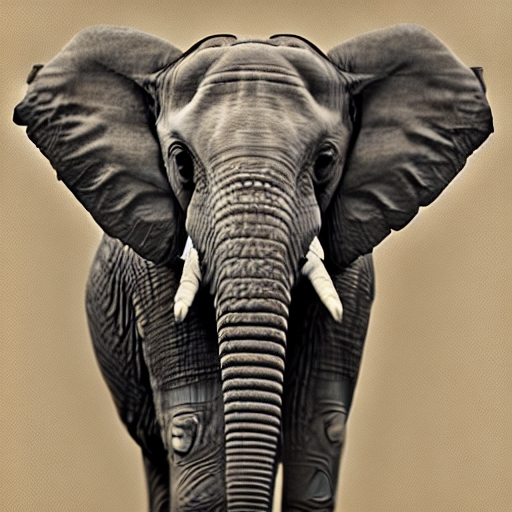

In [15]:
from diffusers import StableDiffusionPipeline
import torch

model_id = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

prompt = "A cute baby elephant wearing sunglasses, digital art"

image = pipe(prompt, num_inference_steps=25, height=512, width=512).images[0]
image.save("sd_test.png")
image


# Example IMAGE → TEXT RETRIEVAL (COCO + FAISS)

In [16]:
from transformers import pipeline
from PIL import Image

blip = pipeline("image-to-text", model="Salesforce/blip-image-captioning-base")

img = Image.open("/content/drive/MyDrive/COCO/val2017/000000000139.jpg")  # change to any real path
caption = blip(img)[0]["generated_text"]

print("Caption:", caption)


Device set to use cuda:0


Caption: a living room with a television and a fireplace


In [17]:
print(blip(Image.open("sd_test.png"))[0]["generated_text"])


an elephant standing in a field with a brown background


  0%|          | 0/50 [00:00<?, ?it/s]

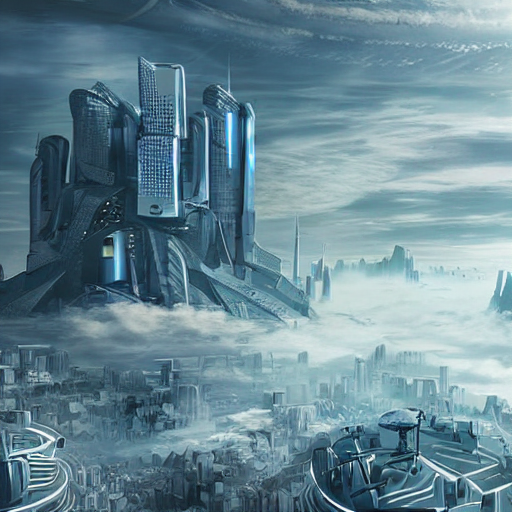

In [18]:
pipe("A futuristic city in clouds").images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

Image 1


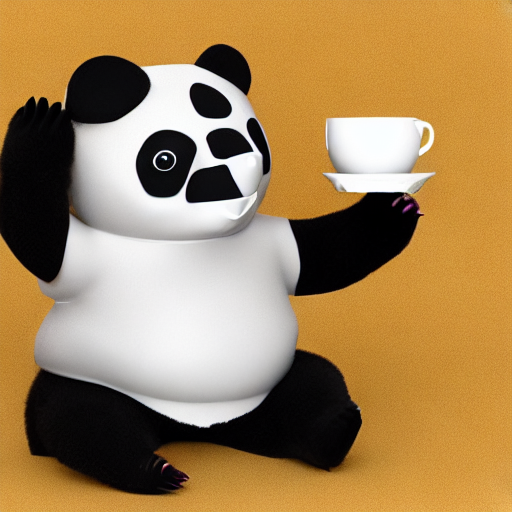

Image 2


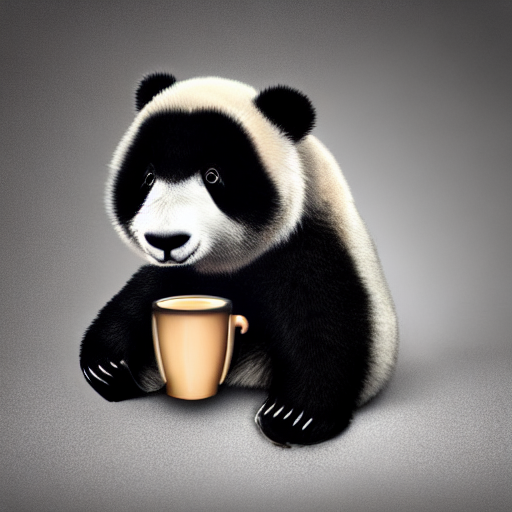

Image 3


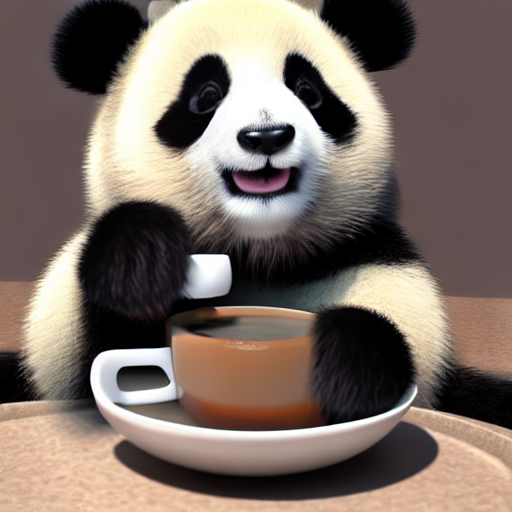

In [19]:
images = pipe(
    "A cute baby panda drinking coffee, 4k render",
    num_images_per_prompt=3,
    num_inference_steps=20
).images

for idx, img in enumerate(images):
    print(f"Image {idx+1}")
    display(img)


  0%|          | 0/20 [00:00<?, ?it/s]

Image 1


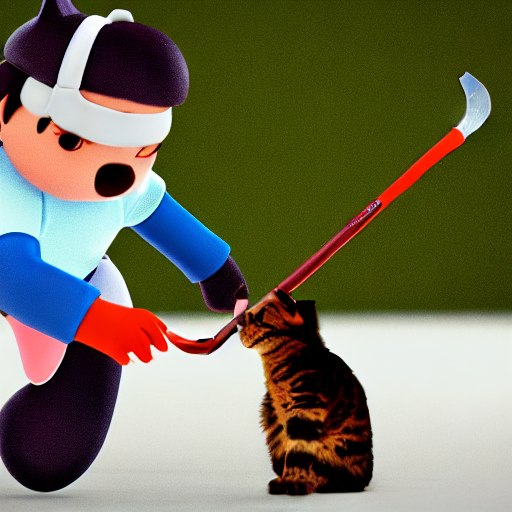

Image 2


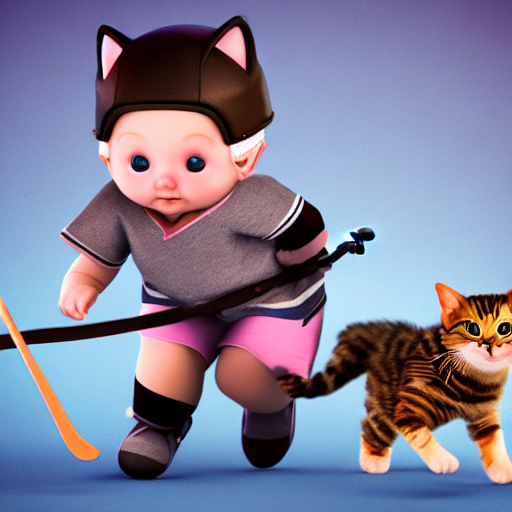

Image 3


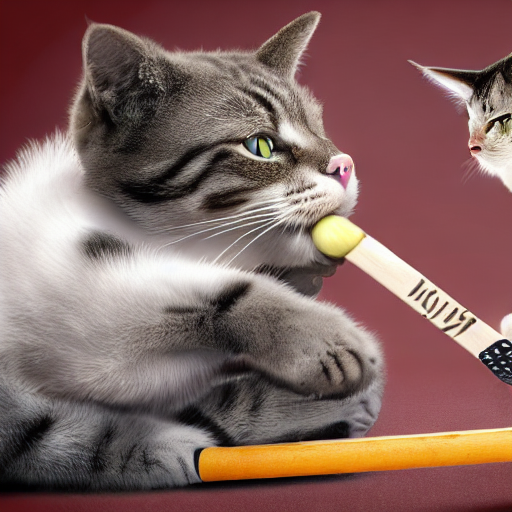

Image 4


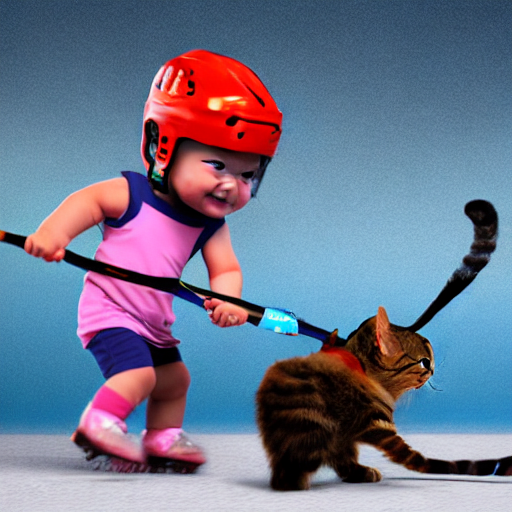

Image 5


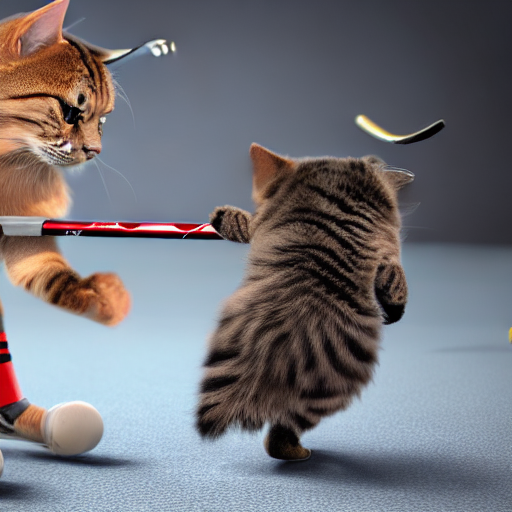

Image 6


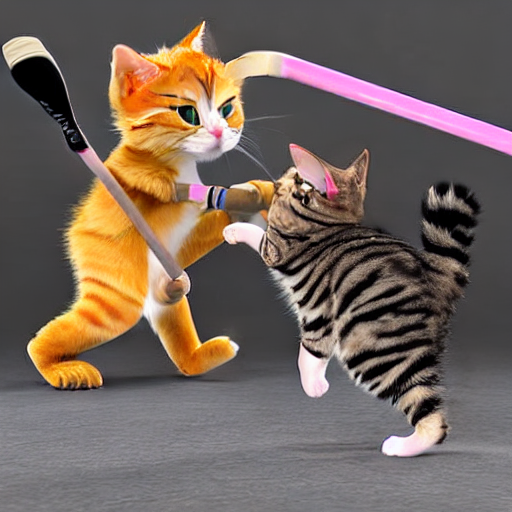

Image 7


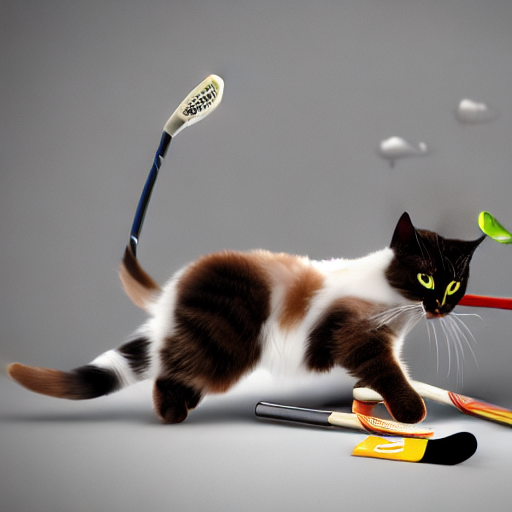

Image 8


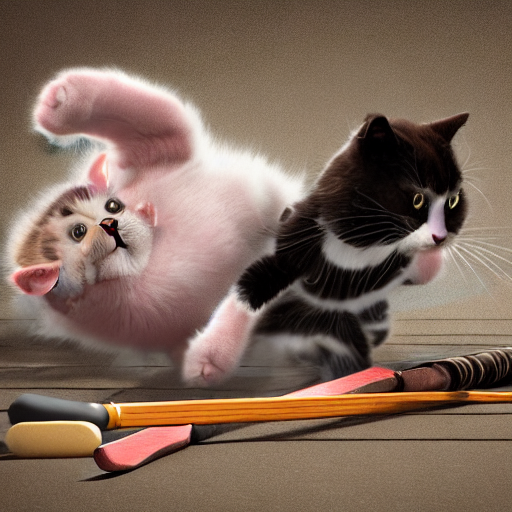

Image 9


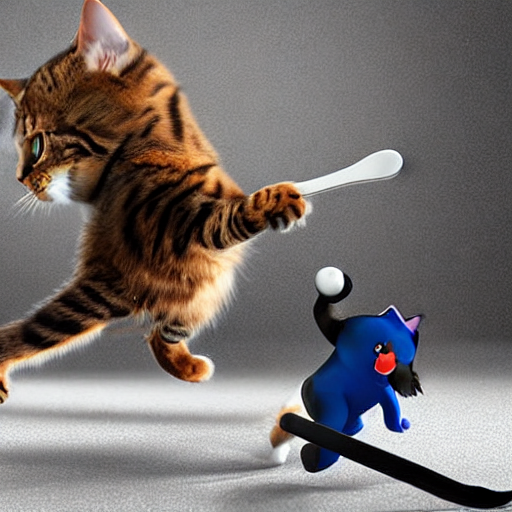

Image 10


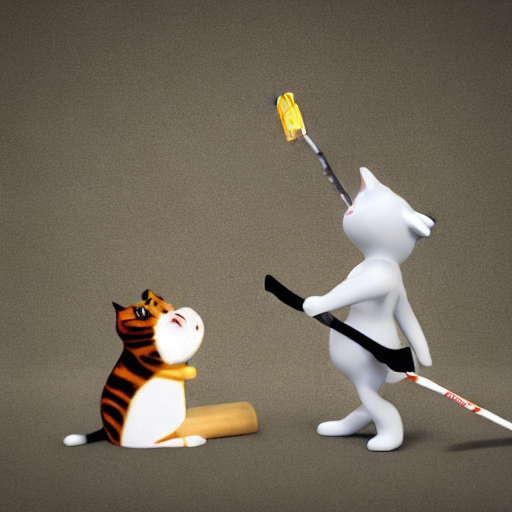

In [20]:
images = pipe(
    "A cute baby beating a cat with hockey stick, 4k render",
    num_images_per_prompt=10,
    num_inference_steps=20
).images

for idx, img in enumerate(images):
    print(f"Image {idx+1}")
    display(img)


In [21]:
blip = pipeline("image-to-text", model="Salesforce/blip-image-captioning-base")

img = Image.open("/content/WhatsApp Image 2025-12-06 at 00.58.25.jpeg")  # change to any real path
caption = blip(img)[0]["generated_text"]

print("Caption:", caption)


Device set to use cuda:0


Caption: a man with a beard standing in front of a whiteboard


  0%|          | 0/20 [00:00<?, ?it/s]

Image 1


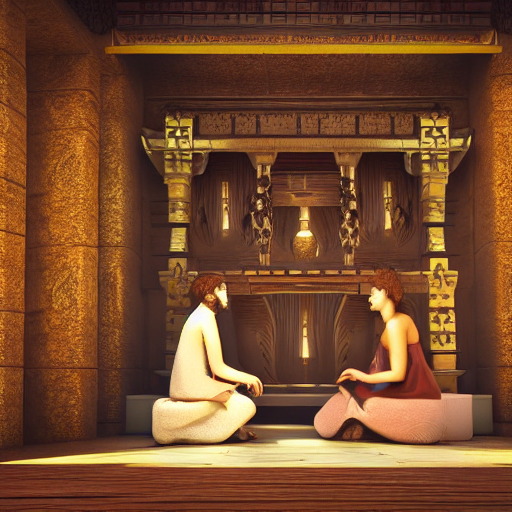

Image 2


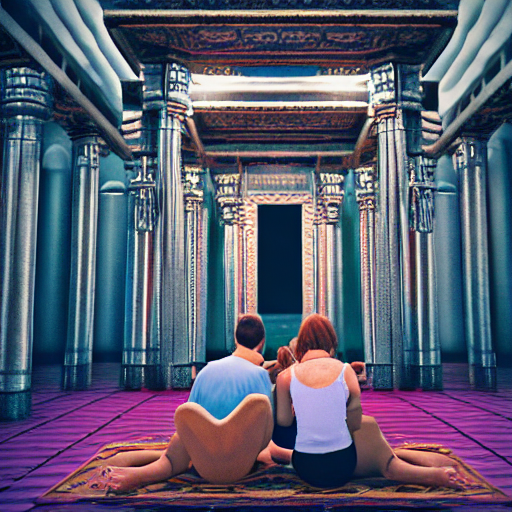

Image 3


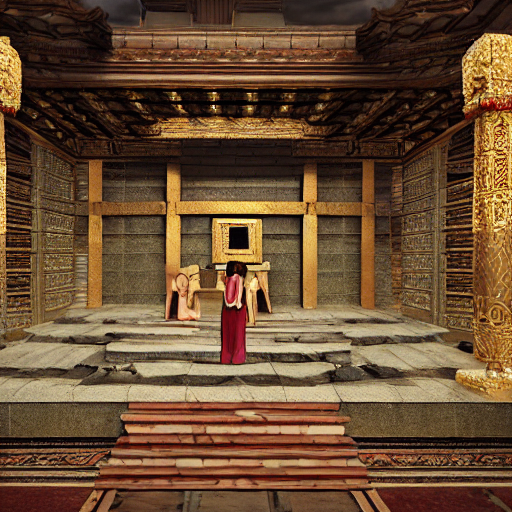

Image 4


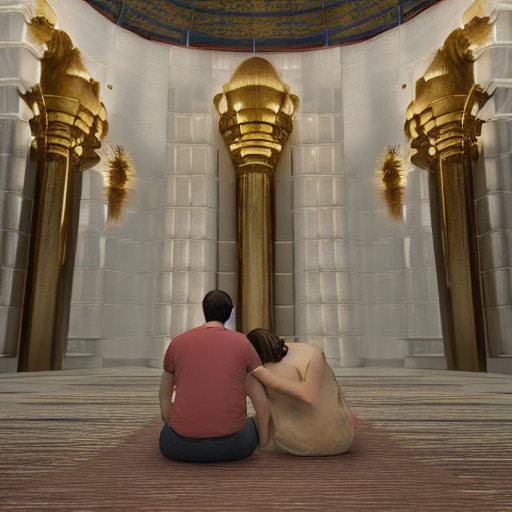

Image 5


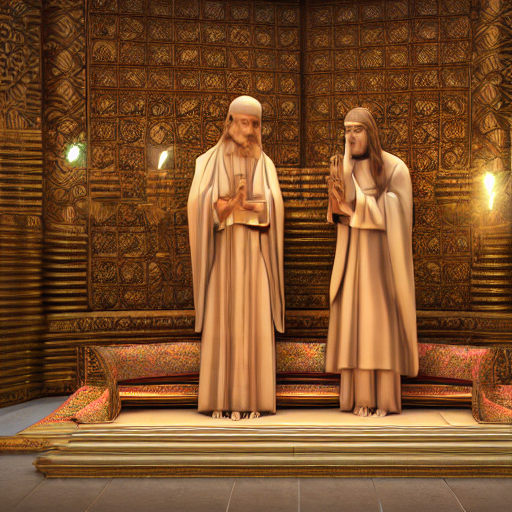

Image 6


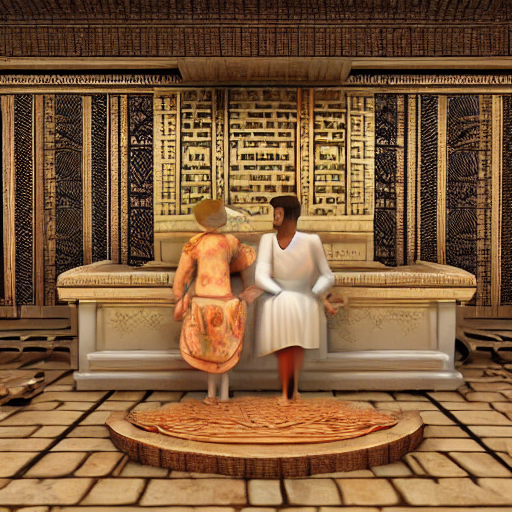

Image 7


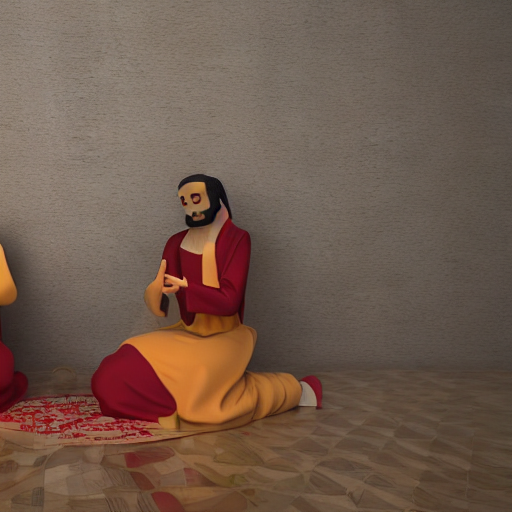

Image 8


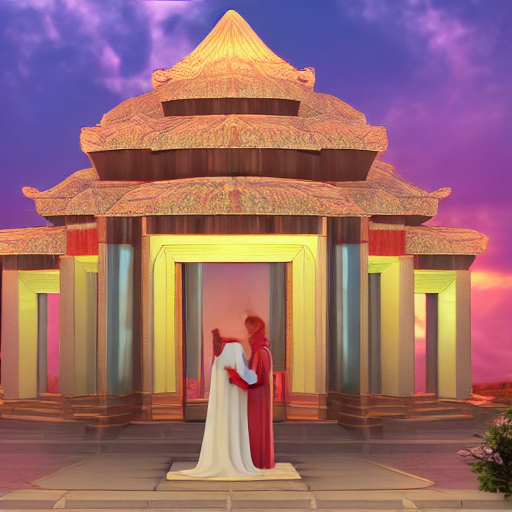

Image 9


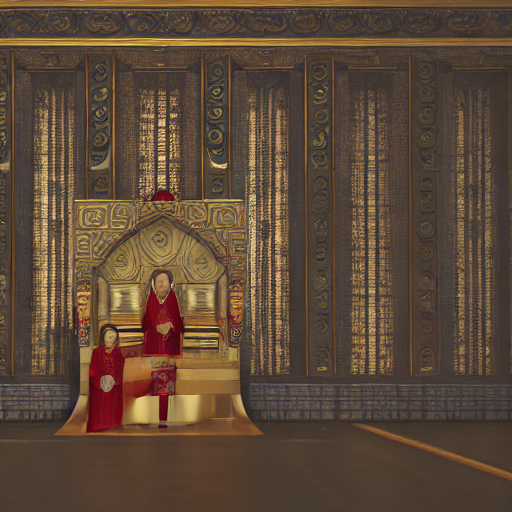

Image 10


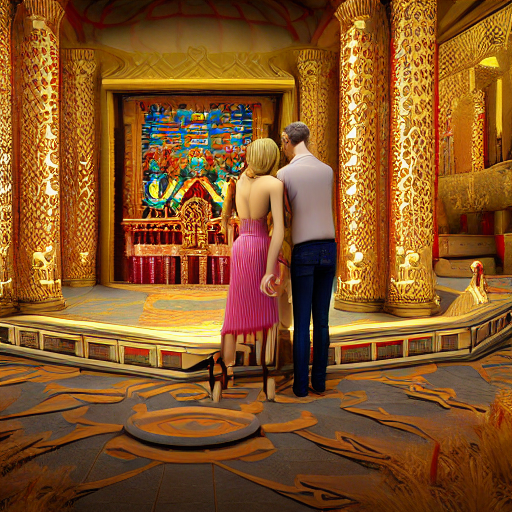

In [23]:
images = pipe(
    "A couple is worshipping in the temple, 4k render",
    num_images_per_prompt=10,
    num_inference_steps=20
).images

for idx, img in enumerate(images):
    print(f"Image {idx+1}")
    display(img)

In [24]:
# 🔹 1. Install moviepy (only once per runtime)
!pip install -q moviepy

# 🔹 2. Create a video from your list of PIL images
from moviepy.editor import ImageClip, concatenate_videoclips
import numpy as np

# images: list of PIL.Image objects (from your pipe(...) call)
output_path = "generated_video.mp4"
duration_per_image = 0.5   # seconds each image stays on screen
fps = 24                   # video fps (standard: 24 or 30)

# make clips from images
clips = []
for img in images:
    frame = np.array(img.convert("RGB"))  # moviepy works with numpy arrays
    clip = ImageClip(frame).set_duration(duration_per_image)
    clips.append(clip)

# concatenate them into one video
final_clip = concatenate_videoclips(clips, method="compose")

# write to file
final_clip.write_videofile(output_path, fps=fps, codec="libx264", audio=False)

print("Video saved as:", output_path)


/usr/local/lib/python3.12/dist-packages/moviepy/config_defaults.py:47: SyntaxWarning: invalid escape sequence '\P'
  IMAGEMAGICK_BINARY = r"C:\Program Files\ImageMagick-6.8.8-Q16\magick.exe"
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:294: SyntaxWarning: invalid escape sequence '\d'
  lines_video = [l for l in lines if ' Video: ' in l and re.search('\d+x\d+', l)]
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:367: SyntaxWarning: invalid escape sequence '\d'
  rotation_lines = [l for l in lines if 'rotate          :' in l and re.search('\d+$', l)]
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:370: SyntaxWarning: invalid escape sequence '\d'
  match = re.search('\d+$', rotation_line)
  if event.key is 'enter':



Moviepy - Building video generated_video.mp4.
Moviepy - Writing video generated_video.mp4



Moviepy - Done !
Moviepy - video ready generated_video.mp4
Video saved as: generated_video.mp4


In [25]:
import imageio
import numpy as np

frames = [np.array(img.convert("RGB")) for img in images]
imageio.mimsave("generated.gif", frames, fps=6)  # 6 frames/sec

print("GIF saved as: generated.gif")


GIF saved as: generated.gif
